<a href="https://colab.research.google.com/github/kheiro-bellahcene/Lidar_Raw_Data_Visualisation/blob/main/kitti_lidar_pynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📌 Note:

This notebook includes code adapted from **Mohamed Hussein**  
(GitHub: [MohamedHussein736](https://github.com/mohamedhussein736)),  
Computer Vision Engineer at **Bosch Romania**.

The original code was primarily used for **LiDAR point cloud visualization**.

I reused this code to:

- Understand how to process raw LiDAR data  
- Convert `.bin` files (KITTI format) to `.pcd` format using **Open3D**  
- Visualize point clouds using **PyPotree**, a Potree-compatible viewer for large-scale point cloud rendering

This served as a first step before implementing early fusion between LiDAR and camera data.

Planned next steps include:

- Calibration matrix handling (extrinsics/intrinsics)  
- 2D object detection using **YOLO**  
- Filtering and fusing LiDAR with camera data for 3D perception


---

# 📦 Download Required Packages


In [ ]:
# Verfication and Visualization of LiDAR and Camera Data Before a Early Fusion
# wget : Allows downloading files from URL inside Colab directly from KITTI Website in our case
!pip install wget

# open3d : Used to read, process and visualize LiDAR point cloud and 3D data
!pip install open3d

# pypotree : Helps to visualize point cloud data interactively in a browser using the Potree viewer
!pip install pypotree

# Download the dataset



In [ ]:
# Mount Google Drive to access files

import os
import wget
from google.colab import drive


# Mount Google Drive

drive.mount('/content/drive', force_remount=False)


# Chang directory to a specific folder in your Drive

%cd /content/drive/My Drive/


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive


In [ ]:
# Set path inside Google Drive

download_path = "/content/drive/My Drive/Camera_lidar_fusion"

# Create the folder if it doesn'et exist

if not os.path.exists(download_path):
  os.makedirs(download_path)
  print(download_path, "-Created Successfully!")

else:
  print("Folder already exist continue . . . !")

Folder already exist continue . . . !


In [ ]:
# Download the kitti dataset

download_path = "/content/drive/MyDrive/Camera_lidar_fusion"
os.makedirs(download_path, exist_ok=True)

# Dataset URL
dataset_url = "https://s3.eu-central-1.amazonaws.com/avg-kitti/raw_data/2011_09_26_drive_0013/2011_09_26_drive_0013_sync.zip"

# Full file path (from URL)
output_file = os.path.join(download_path, dataset_url.split('/')[-1])

# Check if file already exists
if not os.path.exists(output_file):
    print("Downloading dataset zip file... Please wait!.")
    wget.download(dataset_url, out=download_path)
    print("\n Download complete!:", output_file)
else:
    print("File already exists!, skipping download:", output_file)



File already exists!, skipping download: /content/drive/MyDrive/Camera_lidar_fusion/2011_09_26_drive_0013_sync.zip


In [ ]:
# Unzip  KITTI the dataset sequence

# Go to your working directory in Drive
%cd /content/drive/MyDrive/Camera_lidar_fusion/

# Unzip the downloaded file
!unzip -q 2011_09_26_drive_0013_sync.zip

/content/drive/MyDrive/Camera_lidar_fusion
replace 2011_09_26/2011_09_26_drive_0013_sync/oxts/timestamps.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


# Import essential libraries





In [ ]:
# Import essential libraries for image, LiDAR, and point cloud processing

import numpy as np                    # For numerical operations
import cv2                            # OpenCV for image processing
import matplotlib.pyplot as plt       # For plotting and visualizing images
import matplotlib.image as mpimg      # To load and handle images with matplotlib
from IPython.display import Image     # To display images in notebooks
import glob                           # To work with file paths and patterns
import struct                         # To decode binary files like LiDAR .bin
import open3d as o3d                  # For 3D point cloud visualization and processing

print("All required libraries imported successfully. You can continue...")


All required libraries imported successfully. You can continue...


#LiDAR Bin to PCD Conversion:

LiDAR data in the KITTI dataset is stored as raw binary (.bin) files,
where each point contains x, y, z coordinates and intensity values.

However, many point cloud processing tools and libraries,
such as Open3D, use the .pcd (Point Cloud Data) format for easier
manipulation, visualization, and better compatibility.

##This conversion process:
- Reads the raw binary data
- Extracts only the 3D coordinates (x, y, z)
- Saves the processed points in the .pcd format

##Benefits:
- Easier visualization and processing of LiDAR data
- Compatibility with common point cloud libraries

##Technical details:
- Each point in the .bin file contains 4 float32 values: x, y, z, intensity
- Intensity is ignored during conversion
- An Open3D point cloud object is created from the XYZ coordinates
- The point cloud is saved in the .pcd format for further use




In [ ]:
# Path to the folder containing .bin files
data_path = "/content/drive/MyDrive/Camera_lidar_fusion/2011_09_26/2011_09_26_drive_0013_sync/velodyne_points/data/"

# Check if the folder exists
if os.path.exists(data_path):
    print("Folder exists! Here is its content:")
    print(os.listdir(data_path))  # List files in the folder
else:
    raise FileNotFoundError(f"The folder does NOT exist: {data_path}")

# Function to convert a KITTI .bin LiDAR file into a .pcd file
def BinToPcd(point_file):
    size_float = 4  # Size of a float32 in bytes
    list_pcd = []   # List to store point coordinates
    file_to_open = point_file
    file_to_save = str(point_file)[:-3] + "pcd"  # Change file extension to .pcd

    with open(file_to_open, "rb") as f:
        byte = f.read(size_float * 4)  # Read 4 floats (x, y, z, intensity)
        while byte:
            if len(byte) < size_float * 4:
                break  # Stop if not enough bytes left
            x, y, z, intensity = struct.unpack("ffff", byte)  # Unpack 4 float32 values
            list_pcd.append([x, y, z])  # Keep only the XYZ coordinates
            byte = f.read(size_float * 4)  # Read next 4 floats

    np_pcd = np.asarray(list_pcd)  # Convert list to numpy array
    pcd = o3d.geometry.PointCloud()  # Create empty Open3D point cloud object
    pcd.points = o3d.utility.Vector3dVector(np_pcd)  # Assign points to point cloud
    o3d.io.write_point_cloud(file_to_save, pcd)  # Save as .pcd file
    print(f"Converted: {point_file} -> {file_to_save}")

# List all .bin files in the folder
point_files = sorted(glob.glob(os.path.join(data_path, "*.bin")))
print(f"Number of .bin files found: {len(point_files)}")

# Convert each .bin file to .pcd
for binFile in point_files:
    BinToPcd(binFile)

print("All conversions completed.")





Folder exists! Here is its content:
['0000000071.bin', '0000000004.bin', '0000000011.bin', '0000000091.bin', '0000000031.bin', '0000000124.bin', '0000000003.bin', '0000000014.bin', '0000000081.bin', '0000000048.bin', '0000000111.bin', '0000000138.bin', '0000000112.bin', '0000000115.bin', '0000000083.bin', '0000000114.bin', '0000000096.bin', '0000000074.bin', '0000000089.bin', '0000000047.bin', '0000000025.bin', '0000000030.bin', '0000000072.bin', '0000000052.bin', '0000000098.bin', '0000000055.bin', '0000000038.bin', '0000000046.bin', '0000000109.bin', '0000000037.bin', '0000000142.bin', '0000000065.bin', '0000000128.bin', '0000000049.bin', '0000000110.bin', '0000000069.bin', '0000000002.bin', '0000000050.bin', '0000000022.bin', '0000000045.bin', '0000000057.bin', '0000000130.bin', '0000000073.bin', '0000000082.bin', '0000000026.bin', '0000000075.bin', '0000000042.bin', '0000000018.bin', '0000000028.bin', '0000000008.bin', '0000000044.bin', '0000000092.bin', '0000000027.bin', '00000000

# Read images and point cloud in pcd format file

Loaded image and point cloud for frame 100


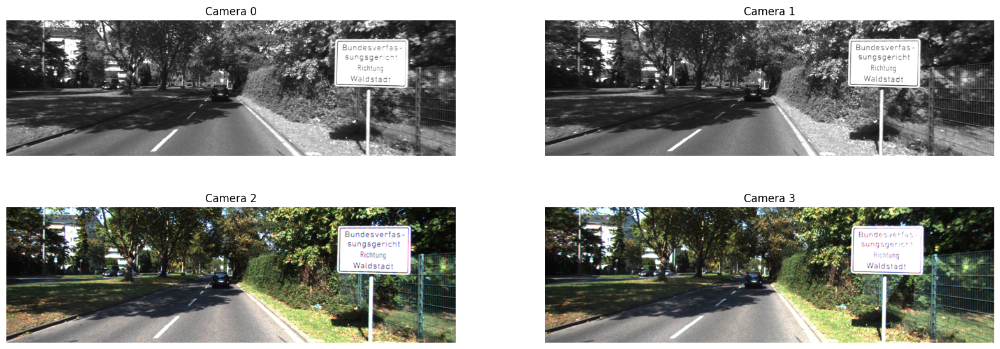

In [ ]:
# -------- Load KITTI images and LiDAR point clouds --------

# Get sorted list of image file paths (.png) from camera 2 folder (example)
image_files = sorted(glob.glob("/content/drive/MyDrive/Camera_lidar_fusion/2011_09_26/2011_09_26_drive_0013_sync/image_02/data/*.png"))

# Get sorted list of point cloud file paths (.pcd) from the corresponding LiDAR folder
point_files = sorted(glob.glob("/content/drive/MyDrive/Camera_lidar_fusion/2011_09_26/2011_09_26_drive_0013_sync/velodyne_points/data/*.pcd"))

index = 100  # Choose the first frame (index 100)

pcd_file = point_files[index]  # Select point cloud file for the first frame

# Read RGB image using OpenCV, convert from BGR to RGB
image = cv2.cvtColor(cv2.imread(image_files[index]), cv2.COLOR_BGR2RGB)

# Load point cloud with Open3D
cloud = o3d.io.read_point_cloud(pcd_file)

# Convert point cloud to NumPy array for further processing
points = np.asarray(cloud.points)

print("Loaded image and point cloud for frame", index)

# -------- Load all 4 camera images for the same frame --------

camera0_images = sorted(glob.glob("/content/drive/MyDrive/Camera_lidar_fusion/2011_09_26/2011_09_26_drive_0013_sync/image_00/data/*.png"))
camera1_images = sorted(glob.glob("/content/drive/MyDrive/Camera_lidar_fusion/2011_09_26/2011_09_26_drive_0013_sync/image_01/data/*.png"))
camera2_images = sorted(glob.glob("/content/drive/MyDrive/Camera_lidar_fusion/2011_09_26/2011_09_26_drive_0013_sync/image_02/data/*.png"))
camera3_images = sorted(glob.glob("/content/drive/MyDrive/Camera_lidar_fusion/2011_09_26/2011_09_26_drive_0013_sync/image_03/data/*.png"))

# Read and convert images from BGR to RGB
img_cam0 = cv2.cvtColor(cv2.imread(camera0_images[index]), cv2.COLOR_BGR2RGB)
img_cam1 = cv2.cvtColor(cv2.imread(camera1_images[index]), cv2.COLOR_BGR2RGB)
img_cam2 = cv2.cvtColor(cv2.imread(camera2_images[index]), cv2.COLOR_BGR2RGB)
img_cam3 = cv2.cvtColor(cv2.imread(camera3_images[index]), cv2.COLOR_BGR2RGB)

# Create 2x2 plot grid to display the 4 camera images
fig, axs = plt.subplots(2, 2, figsize=(20, 7))

axs[0, 0].imshow(img_cam0)
axs[0, 0].set_title('Camera 0')
axs[0, 0].axis('off')

axs[0, 1].imshow(img_cam1)
axs[0, 1].set_title('Camera 1')
axs[0, 1].axis('off')

axs[1, 0].imshow(img_cam2)
axs[1, 0].set_title('Camera 2')
axs[1, 0].axis('off')

axs[1, 1].imshow(img_cam3)
axs[1, 1].set_title('Camera 3')
axs[1, 1].axis('off')

plt.show()

# Visualize the images


Text(0.5, 1.0, 'Image')

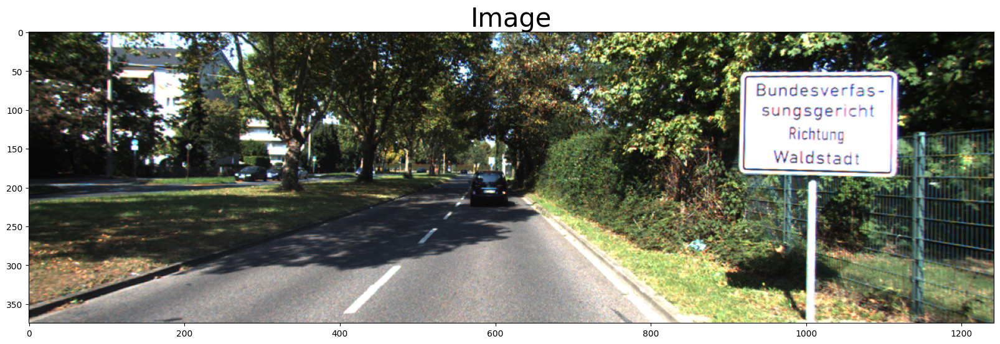

In [ ]:

f, (ax1) = plt.subplots(1, 1, figsize=(20,10))
ax1.imshow(image)
ax1.set_title('Image', fontsize=30)

# Visualize the point cloud


In [ ]:

import pypotree
cloudpath = pypotree.generate_cloud_for_display(points)
pypotree.display_cloud_colab(cloudpath)


/usr/local/lib/python3.11/dist-packages/bin/PotreeConverter .tmp.txt -f xyz -o point_clouds -p 28a9d4 --material ELEVATION --edl-enabled --overwrite
https://localhost:46125/point_clouds/pointclouds/28a9d4


In [ ]:





# show sample of lidar pcd data
print(points)



[[63.72999954 10.43700027  2.39299989]
 [63.65399933 10.63000011  2.39100003]
 [41.18299866  9.49100018  1.63800001]
 ...
 [ 3.74499989 -1.41700006 -1.75100005]
 [ 3.75       -1.41199994 -1.75300002]
 [ 3.76699996 -1.40499997 -1.75800002]]
